In [ ]:
# base
import os
import gc
import pickle
from pathlib import Path
import warnings
import logging

logging.basicConfig(level="WARNING")
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

# data manipulation
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import itables

itables.init_notebook_mode(all_interactive=True)

warnings.simplefilter("ignore", pd.errors.DtypeWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

# single cell
import anndata as ad
import scanpy as sc
import squidpy as sq
import liana as li
import commot as ct

# custom
from single_cell.R import *
from single_cell.preprocess import *
from single_cell.plot import *
from single_cell.analysis import *
from spatial_seq.plot import *
from utils import *

# R
import rpy2.robjects as ro
from rpy2.robjects.conversion import localconverter

%load_ext rpy2.ipython

# analysis & device specific
converter = get_converter()
CORES = 20
DATADIR = Path("../../../../data") / "processed" / "external"
REFDIR = Path("../../../../references") / "Pailin_references"

%matplotlib inline
mpl.rcdefaults()


def AddPailinLabels(ax, adata, fontsize=10):
    for i in range(3):
        ax.text(
            (i + 0.5) / 3,
            0.97,
            adata.obs["batch"].cat.categories.to_list()[i],
            transform=ax.transAxes,
            ha="center",
            fontsize=fontsize / 2,
        )
    for i in range(3):
        ax.text(
            0.04,
            1 - (i + 0.5) / 3,
            adata.obs["timepoint"].cat.categories.to_list()[i],
            transform=ax.transAxes,
            va="center",
            ha="right",
            rotation=90,
            fontsize=fontsize,
        )

gc.collect()

/mnt/DATA/home/ethung/spatial_seq/.venv/lib/python3.12/site-packages/phenograph/cluster.py:13: DeprecationWarning: Please import `spmatrix` from the `scipy.sparse` namespace; the `scipy.sparse.base` namespace is deprecated and will be removed in SciPy 2.0.0.


86695

# HotspotSC

In [7]:
adata = ad.read_zarr(DATADIR / "analyzed.zarr")
adata = adata[adata.obs["sample"] == adata.obs["sample"][0]]
sc.pp.filter_genes(adata, min_cells=3)

/tmp/ipykernel_3958315/428195940.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/mnt/DATA/home/ethung/spatial_seq/.venv/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:278: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


/tmp/ipykernel_3958315/3271853139.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


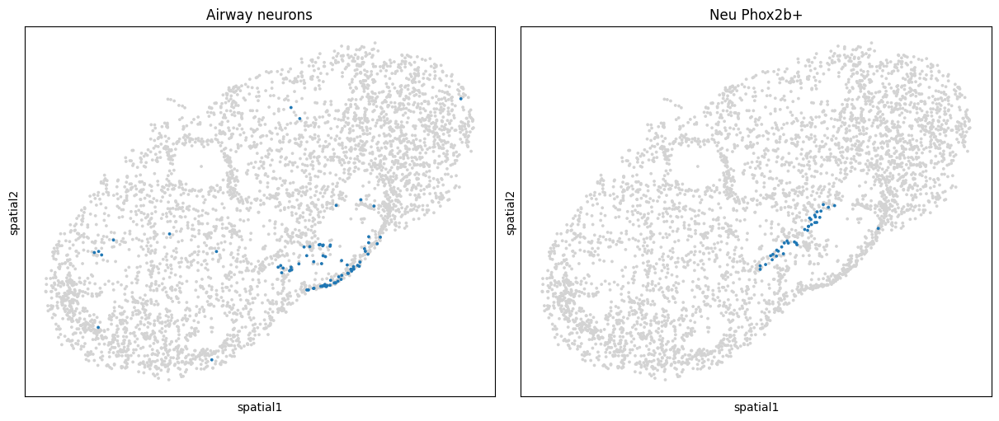

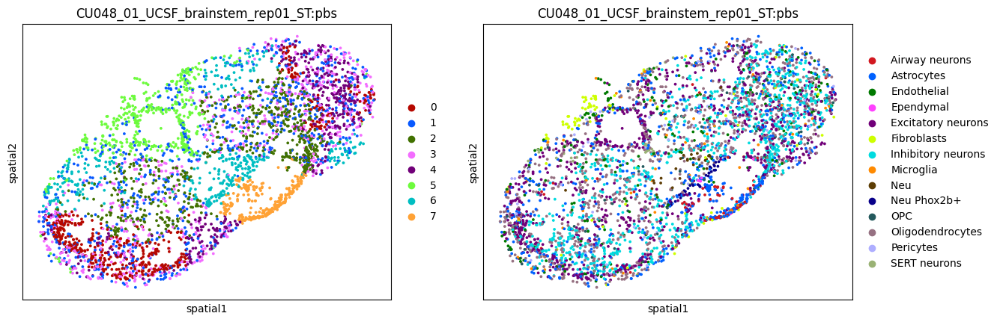

In [44]:
celltypes_focus = ["Airway neurons", "Neu Phox2b+"]
r, c = 1, len(celltypes_focus)
ax = plt.subplots(r,c,figsize=(c*6, r*5), layout="constrained")[1].flatten()

for i,ct in enumerate(celltypes_focus):
    adata.obs["temp"] = adata.obs["celltype"].isin([ct]).map({True : ct, False : pd.NA})
    sc.pl.embedding(adata, basis="spatial", color=["temp"], size=30, title=ct, ax=ax[i], show=False, legend_loc=None)
    adata.obs.drop(columns="temp", inplace=True)

sc.pl.embedding(adata, basis="spatial", color=["cellcharter_k8", "celltype"], size=30, title=[adata.obs["sample"][0]]*2)

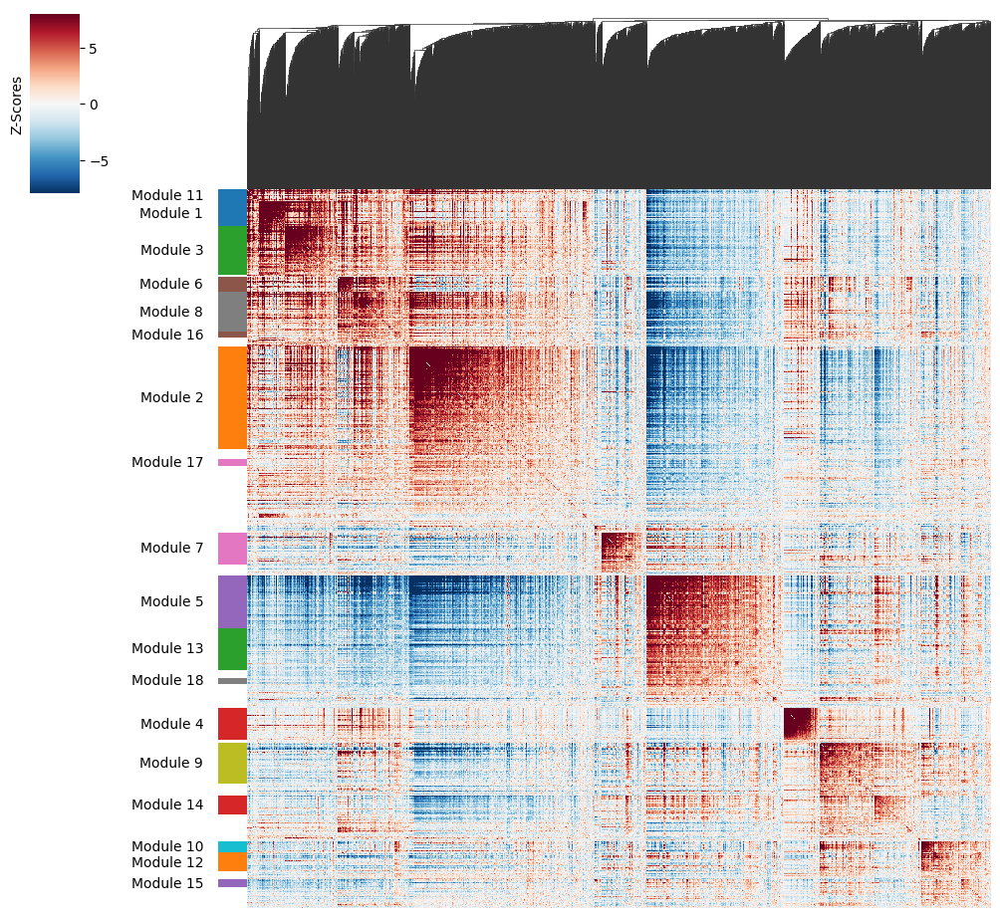

In [3]:
import mplscience
#open the objects
with open(DATADIR / "tools" / "hotspotsc" / "hotspot.pkl", 'rb') as f:
    hs = pickle.load(f)

hs.plot_local_correlations()

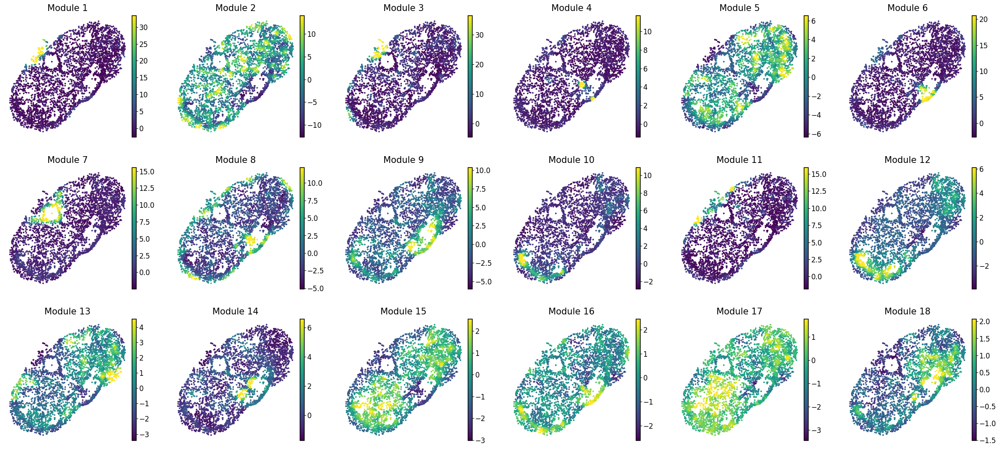

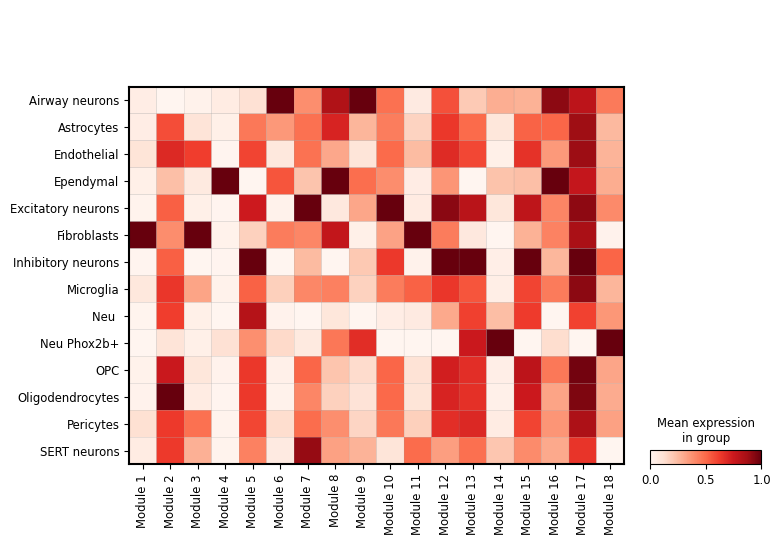

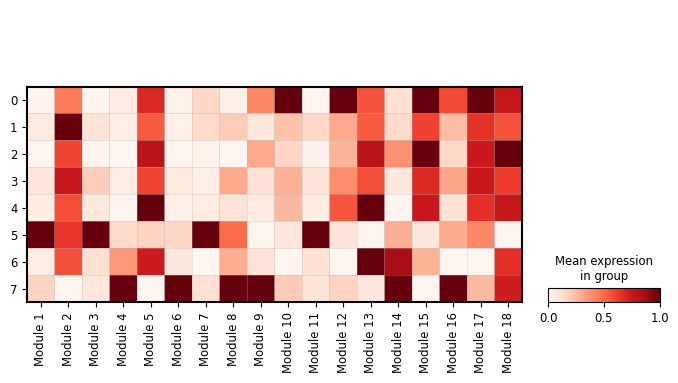

In [ ]:
# module_scores = hs.calculate_module_scores()
print(modules.value_counts())
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)

with mplscience.style_context():
    sc.pl.embedding(adata, basis="spatial", color=module_cols, frameon=False, vmin="p0", vmax="p99", size=30, ncols=6)

sc.pl.matrixplot(adata, module_cols, "celltype", standard_scale="var", cmap="Reds")
sc.pl.matrixplot(adata, module_cols, "cellcharter_k8", standard_scale="var", cmap="Reds")

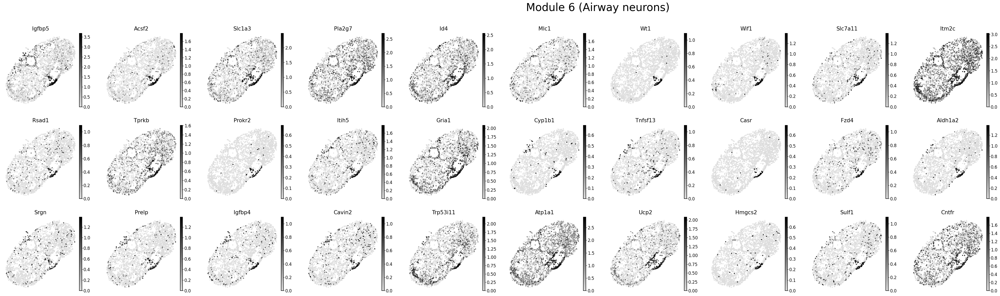

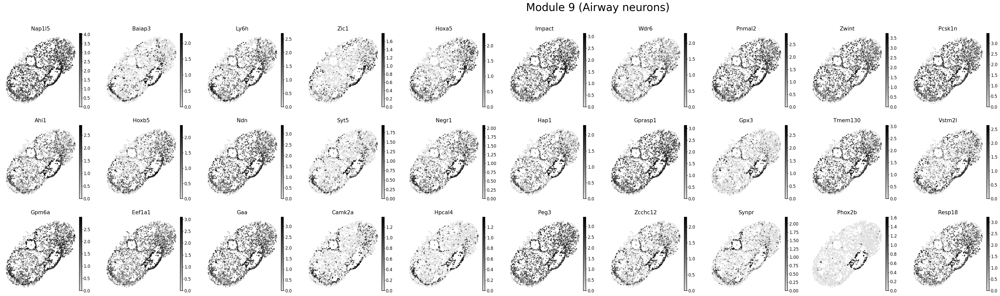

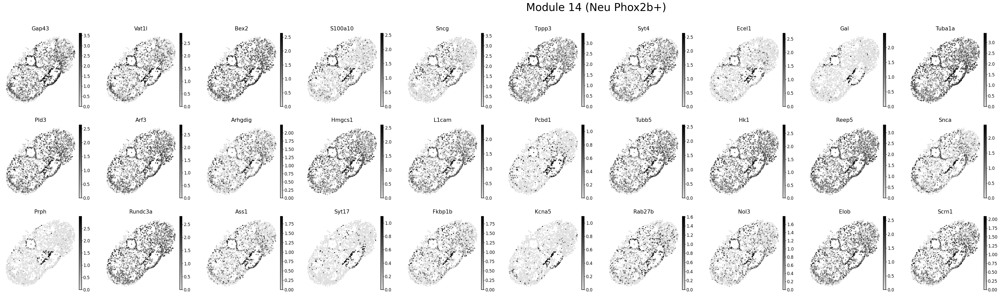

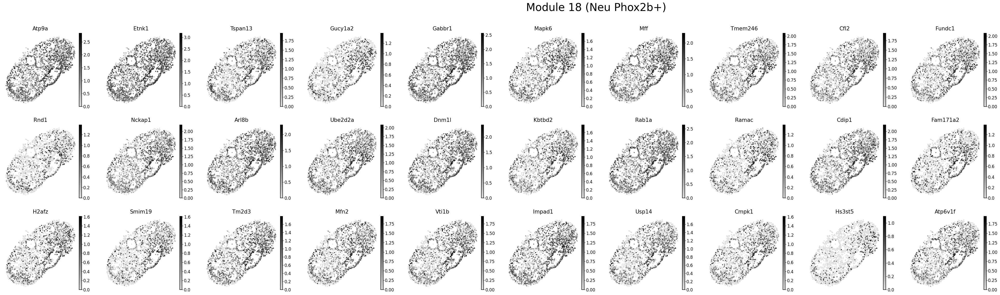

In [41]:
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'grays', ['#DDDDDD', '#000000'])
N = 30
results = hs.results.join(hs.modules)

modules = {
    "Airway neurons" : [6, 9],
    "Neu Phox2b+" : [14, 18],
}

# airway neuron modules
for ct in modules:
    for module in modules[ct]:
        genes = results.loc[results.Module == module].sort_values('Z', ascending=False)

        with mplscience.style_context():
            f = sc.pl.embedding(adata, basis="spatial", color=genes.head(N).index, frameon=False, cmap=cmap, layer="normalized", vmin=0, vmax="p99", size=30, ncols=10, return_fig=True, show=False)
        f.suptitle(f"Module {module} ({ct})", size=30)